# <div align="center"><b> Проект: Исследование рынка заведений общественного питания Москвы</b></div>

**Описание проекта:**  
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.      
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.  
Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Выполнение проекта планирую в несколько этапов:**
- Загрузка данных и изучение информации
- Предобработка данных
- Анализ  данных
- Детализируем исследование
- Презентация
- Вывод 

### Загрузка данных и изучение информации

In [1]:
# загружаем необходимые библиотеки
import pandas as pd
import numpy as np
import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
from folium import Marker, Map

In [2]:
#загружаем данные

try:
    data = pd.read_csv('C:/datasets/moscow_places.csv',sep=',')
except:
    data = pd.read_csv('/datasets/moscow_places.csv',sep=',')
display(data.head(10))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [3]:
# посмотрим общую информацию о данных, пропусках, дубликатах
def tab_inf (data):
    print('\033[1m' + '===Общая информация о данных===' + '\033[0m')
    display(data.info())
    print('\033[1m' + '===Размер таблицы===' + '\033[0m')
    display(data.shape)
    print('\033[1m' + '===Статистические данные===' + '\033[0m')
    display(data.describe())
    print('\033[1m' + '===Количество пропусков===' + '\033[0m')
    display(data.isna().sum())
    print('\033[1m' + '===Количество дубликатов===' + '\033[0m')
    if data.duplicated().sum() > 0:
        print('\033[1m' + 'Дубликаты: ' + '\033[0m', data.duplicated().sum())
    else:
        print('\033[1m' + '===Дубликатов НЕТ===' + '\033[0m')
    print('\033[1m' + '===Количество заведений===' + '\033[0m') 
    print('Общее количество заведений: ', data['name'].nunique())

In [4]:
tab_inf(data)

===Общая информация о данных===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

===Размер таблицы===


(8406, 14)

===Статистические данные===


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


===Количество пропусков===


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

===Количество дубликатов===
===Дубликатов НЕТ===
===Количество заведений===
Общее количество заведений:  5614


Названия столбцов у нас корректны;  
В таблице присутствует 8406 строки и 14 столбцов;  
Приведем к нижнему регистру столбцы 'name, address, avg_bill';
В столбце 'seats' поменяем тип на int64, так как в количестве посадочных мест должно быть целое число;  
И также в столбце 'seats', видно что в некоторых заведениях кол-во посадочным мест 1288, явно это очень много, дальше еще посмотрим;  
Найдены пропущенные значения в 6-ти столбцах, дальше будем с ними разбираться;  
Явные дубликаты отсутствуют, еще посмотрим по неявным;  
Общее количество заведений:  5614;  

### Предобработка данных

In [5]:
# Приведем к нижнему регистру столбцы 'name, address, district, avg_bill'
for i in ['name', 'address', 'avg_bill']:
    data[i] = data[i].str.lower()
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [6]:
# посмотрим процент пропущенных значений от всего датасета
def pers_inf (data):
    print('Процент пропусков в столбце hours: ', data['hours'].isna().mean()*100)
    print('Процент пропусков в столбце price: ',data['price'].isna().mean()*100)
    print('Процент пропусков в столбце avg_bill: ',data['avg_bill'].isna().mean()*100)
    print('Процент пропусков в столбце middle_avg_bill: ',data['middle_avg_bill'].isna().mean()*100)
    print('Процент пропусков в столбце middle_coffee_cup: ',data['middle_coffee_cup'].isna().mean()*100)
    print('Процент пропусков в столбце seats: ',data['seats'].isna().mean()*100)

In [7]:
pers_inf(data)

Процент пропусков в столбце hours:  6.376397811087318
Процент пропусков в столбце price:  60.5638829407566
Процент пропусков в столбце avg_bill:  54.603854389721626
Процент пропусков в столбце middle_avg_bill:  62.538662859862
Процент пропусков в столбце middle_coffee_cup:  93.63549845348561
Процент пропусков в столбце seats:  42.95741137282893


Видим, что большое количество пропусков в данных стобцах, удалять точно не будем, так как может сильно повлиять на дальнейший анализ.  
В столбце 'hours'(график работы) можно заменить пропуски на 'информация отсутствует'.

In [8]:
# заменим пропуски в столбце hours
data['hours'] = data['hours'].fillna('информация отсутствует')

В столбце 'price' описывают категорию цен в заведении, здесь я думаю пропуски заменим на заглушку -1.


In [9]:
#пропуски в price заменим на заглушку -1
data['price'] = data['price'].fillna(-1)

Пропуски в столбцах avg_bill, middle_avg_bill, middle_avg_bill думаю также заменим на заглушку -1, чтоб не искажался дальнейший анализ.  
Но для начала проверим: 
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт», если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт;
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена чашки капучино», если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт;

In [10]:
#пропуски в avg_bill заменим на заглушку -1
data['avg_bill'] = data['avg_bill'].fillna(-1)

In [11]:
#выведем количество не пропущенных значений в столбце middle_avg_bill
len(data.query('~middle_avg_bill.isna()'))

3149

In [12]:
#найдём количество строк, столбца avg_bill, которые начинаются с подстроки «cредний счёт»
data.avg_bill.str.contains('средний счёт').sum()

3149

Видим, что количество строк 3149 в 'avg_bill' с подстрокой «cредний счёт», совпадает с количеством не пропущенных значений в столбце middle_avg_bill, значит здесь все корректно и можем поставить заглушку -1.

In [13]:
#пропуски в middle_avg_bill заменим на заглушку -1
data['middle_avg_bill'] = data['middle_avg_bill'].fillna(-1)

In [14]:
#выведем количество не пропущенных значений в столбце middle_coffee_cup
len(data.query('~middle_coffee_cup.isna()'))

535

In [15]:
#найдём количество строк, столбца avg_bill, которые начинаются с подстроки «цена чашки капучино»
data.avg_bill.str.contains('цена чашки капучино').sum()

535

Здесь также данные равны, значит все заполнено корректно, можем поставить заглушку -1.

In [16]:
#пропуски в middle_coffee_cup заменим на заглушку -1
data['middle_coffee_cup'] = data['middle_coffee_cup'].fillna(-1)

In [17]:
#посмотрим столбец seats
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

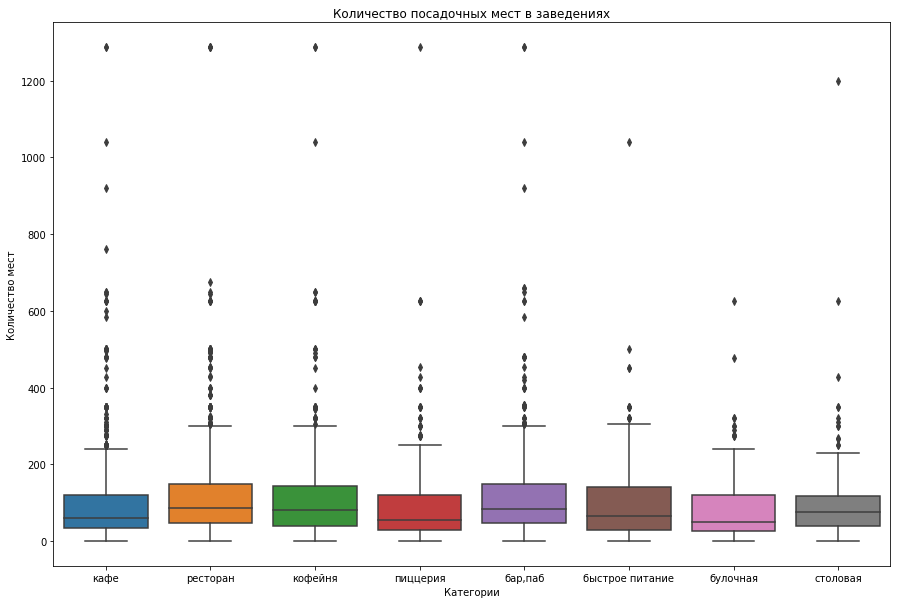

In [18]:
#построим диаграмму размаха, чтоб посмотреть выбросы
plt.figure(figsize=(15,10))
(sns.boxplot(data=data, 
             x='category', 
             y='seats')
 .set(title='Количество посадочных мест в заведениях',
      xlabel='Категории',
      ylabel='Количество мест'))
plt.show()

По диаграмме видно, что есть выбросы по количеству посадочных мест, видимо допустили ошибку при заполнении данных.  
Поставим границу в 500 мест.

In [19]:
# приведем столбец "seats" к нужному типу данных
data['seats'] = data['seats'].fillna(-1)
data['seats'] = data['seats'].astype('int')

In [20]:
#посмотрим количество посадочных мест свыше 500
(data[data['seats'] > 500]['name'].count())

56

56 мест свыше 500, это менее 1% от датасета, и их можно удалить.

In [21]:
d1 = data[data['seats'] > 500]
data = data.query('index not in @d1.index')
print(data[data['seats'] > 500]['name'].count())

0


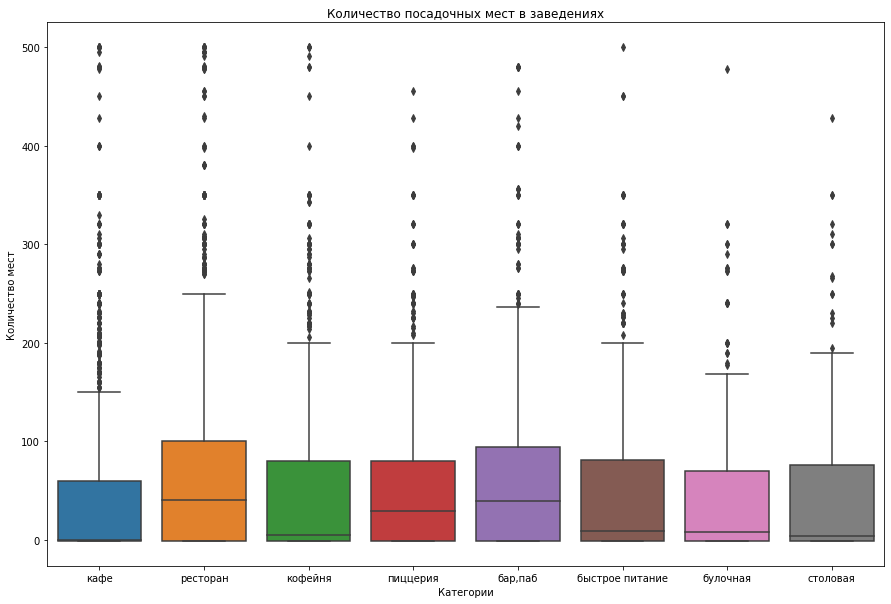

In [22]:
#еще раз выведем диаграмму
plt.figure(figsize=(15,10))
(sns.boxplot(data=data, 
             x='category', 
             y='seats')
 .set(title='Количество посадочных мест в заведениях',
      xlabel='Категории',
      ylabel='Количество мест'))
plt.show()

Конечно значения больше 400 мест меня тоже смушают, но их уже оставим, а большое удаление строк из таблицы также скажется на дальнейшем анализе.

In [23]:
#выведем информацию
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8350 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8350 non-null   object 
 1   category           8350 non-null   object 
 2   address            8350 non-null   object 
 3   district           8350 non-null   object 
 4   hours              8350 non-null   object 
 5   lat                8350 non-null   float64
 6   lng                8350 non-null   float64
 7   rating             8350 non-null   float64
 8   price              8350 non-null   object 
 9   avg_bill           8350 non-null   object 
 10  middle_avg_bill    8350 non-null   float64
 11  middle_coffee_cup  8350 non-null   float64
 12  chain              8350 non-null   int64  
 13  seats              8350 non-null   int64  
dtypes: float64(5), int64(2), object(7)
memory usage: 1.2+ MB


С пропусками разобрались, еще проверим на неявные дубликаты.

In [24]:
#проверим на неявные дубликаты столбцы name и address
data[data.duplicated(subset=['name', 'address'],
                       keep=False)].sort_values('name')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,-1,-1,-1.0,-1.0,0,188
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,-1,-1,-1.0,-1.0,1,188
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,-1,-1,-1.0,-1.0,0,-1
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,-1,-1,-1.0,-1.0,0,-1
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,-1,-1,-1.0,-1.0,0,150
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,-1,-1,-1.0,-1.0,1,150
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,-1,-1,-1.0,-1.0,1,276
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,информация отсутствует,55.738449,37.410937,4.1,-1,-1,-1.0,-1.0,0,276


Найдены повторяющиеся строки, удалим: 
- с индексом 1511, так как нашел, что это ресторан доставки и у них график с 9 до 21;
- с индексом 189, указаны некорректные координаты;
- с индексом 2211, график работы указан неправильно;
- с индексом 3109, график работы указан неправильно;

In [25]:
#удалим эти строки и сделаем сброс индексов
data = data.drop(index=[1511,189,2211,3109]).reset_index(drop=True) 

In [26]:
#еще раз проверим на неявные дубликаты столбцы name и address
data[data.duplicated(subset=['name', 'address'],
                       keep=False)].sort_values('name')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [27]:
#создадим столбец street с названиями улиц из столбца с адресом
data['street'] = data['address'].str.split(', ').str[1]

In [28]:
#создадим столбец is_24_7 с обозначением, что заведение работает(24/7)
data['is_24_7'] = data['hours'] == 'ежедневно, круглосуточно'
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,-1,-1,-1.0,-1.0,0,-1,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,-1.0,0,4,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,-1.0,0,45,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,-1,цена чашки капучино:155–185 ₽,-1.0,170.0,0,-1,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,-1.0,1,148,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8341,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,-1,-1,-1.0,-1.0,0,86,профсоюзная улица,False
8342,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,-1,-1,-1.0,-1.0,0,150,пролетарский проспект,False
8343,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,-1,средний счёт:от 150 ₽,150.0,-1.0,0,150,люблинская улица,True
8344,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,-1,-1,-1.0,-1.0,1,150,люблинская улица,True


In [29]:
#посмотрим как изменился размер таблицы
display(data.shape)

(8346, 16)

Потери по данным минимальные, так что можно проводить дальнейший анализ.

**На этом предобработку можно закончить, сделаем промежуточный вывод:**
- Загрузили данные;
- Привели названия столбцов к нижнему регистру;
- Найдены пропущенные значения в 6ти столбцах;
- В столбце 'hours'(график работы) заменили пропуски на 'информация отсутствует';
- В остальных столбцах заменили заглушкой -1;
- Устранили явные выбросы в столбце seats(количество посадочных мест);
- Явных дубликатов не найдено;
- В неявных найдено 4 пары повторяющихся строк, некорректные удалили;
- Создали столбец street с названиями улиц из столбца с адресом;
- Создали столбец is_24_7 с обозначением, что заведение работает(24/7);

### Анализ данных

#### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [30]:
category_1 = data.groupby('category')['name'].count().reset_index()
category_1.columns = ['category', 'count']
category_1.sort_values('count', ascending=False)

,category,count
3,кафе,2362
6,ресторан,2029
4,кофейня,1401
0,"бар,паб",755
5,пиццерия,629
2,быстрое питание,602
7,столовая,313
1,булочная,255


In [31]:
fig = go.Figure()
fig = px.bar(category_1.sort_values('count', ascending=False), 
             x='category', 
             y='count', 
             text='count',
             title='Количество объектов общественного питания по категориям',
             template='plotly_white'
            )
fig.update_layout(xaxis_title='Категории',
                  yaxis_title='Количество')
fig.show()

In [32]:
#go.Figure(data=[go.Pie(labels=category_1['category'],
         #              values= category_1['count'])],
        #  layout = go.Layout(title=go.layout.Title(text='Соотношение категорий заведений')))

По количеству заведений:
- на первом месте у нас 'кафе'(2362);
- на 2ом - 'ресторан'(2029);
- на 3-м - 'кофейня'(1401);
- на последнем - 'булочная'(255);  

#### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [33]:
seats_1 = (data.query('seats != -1') #фильтруем заглушку
            .groupby('category') 
            .agg(median=('seats', 'median')) #применим медианное значение, так как еще присутствуют выбросы
            .sort_values(by='median', ascending=False) 
            .reset_index())
seats_1['median'] = seats_1['median'].astype('int')
seats_1

,category,median
0,ресторан,85
1,"бар,паб",80
2,кофейня,78
3,столовая,75
4,быстрое питание,65
5,кафе,60
6,пиццерия,52
7,булочная,50


In [34]:
fig = px.bar(seats_1.sort_values(by='median'), 
             x='median', 
             y='category', 
             text='median',
             title='Количество посадочных мест по категориям',
             template='plotly_white'
            )
fig.update_layout(xaxis_title='Количество',
                  yaxis_title='Категории')
fig.show()

Рестораны лидируют по количеству посадочных мест, это впринципе логично, так как обычно какие нибудь крупные мероприятия проводят в ресторанах.  
Пиццерии и булочные на последнем месте по количеству мест, эти заведения больше располагают легкими перекусами и едой на вынос, поэтому не рассчитывают на большое количество посадочных мест.

#### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

в столбце chain - число, выраженное 0 или 1:
- 1 сетевое заведение
- 0 несетевое заведение

In [35]:
chain = data.groupby('chain')['name'].count().reset_index()
chain.sort_values('chain', ascending=False)

,chain,name
1,1,3178
0,0,5168


In [36]:
go.Figure(data=[go.Pie(labels=chain['chain'],
                       values= chain['name'])],
          layout = go.Layout(title=go.layout.Title(text='Соотношение сетевых и несетвых заведений')))

Большая часть заведений в Москве являются несетевыми ~62%, сетевых заведений ~38%.

#### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [37]:
chain_1 = data.groupby(['category','chain'])['name'].count().reset_index()
chain_1['chain'] = chain_1['chain'].astype(object)
chain_1 = chain_1.sort_values(by=['name','chain'], ascending=False)
chain_1

,category,chain,name
6,кафе,0,1588
12,ресторан,0,1308
7,кафе,1,774
13,ресторан,1,721
9,кофейня,1,713
8,кофейня,0,688
0,"бар,паб",0,587
4,быстрое питание,0,371
11,пиццерия,1,328
10,пиццерия,0,301


In [38]:
fig = px.bar(chain_1.sort_values(by=['name','chain']), 
             x='name', 
             y='category', 
             color='chain',
             text='name', 
             title='Количество сетевых/несетевых заведений по категориям',
             template='plotly_white')
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Категории')
fig.show()

Чаще всего являются сетевыми заведениями это:
- кофейни 713/688;
- пиццерии 328/301;
- булочные 156/99;
  
Все остальные в основном несетевые.


#### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся? 

In [39]:
f = data.query('chain == 1')
top_chain = (f.groupby('name')
            .agg({'category' : pd.Series.mode,'chain':'count'})
            .sort_values(by='chain', ascending=False)
            .reset_index()
            .head(15))
top_chain

,name,category,chain
0,шоколадница,кофейня,118
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,70
4,яндекс лавка,ресторан,68
5,cofix,кофейня,65
6,prime,ресторан,50
7,хинкальная,кафе,44
8,кофепорт,кофейня,42
9,кулинарная лавка братьев караваевых,кафе,38


In [40]:
fig = px.bar(top_chain.sort_values(by='chain', ascending=False), 
             x='name', 
             y='chain', 
             color='category',
             text='chain', 
             title='ТОП-15 популярный сетей в Москве',
             template='plotly_white')
fig.update_layout(xaxis_title='Название заведения',
                  yaxis_title='Количество')
fig.show()

Самый топ это сетевая кофейня "Шоколадница", затем следуют 2 известные всем пиццерии "Домино'с пицца" и "Додо пицца".  
Замыкает список 15ти заведений кафе "Му-му".  

В топ15 сетевых заведений наибольшее число занимают:
- кофейни;
- рестораны;
- кафе;  

Преобладают кофейни.

#### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [41]:
#посмотрим какие административные районы Москвы присутствуют в датасете
data['district'].value_counts()

Центральный административный округ         2242
Южный административный округ                891
Северо-Восточный административный округ     890
Северный административный округ             875
Западный административный округ             830
Восточный административный округ            789
Юго-Восточный административный округ        714
Юго-Западный административный округ         706
Северо-Западный административный округ      409
Name: district, dtype: int64

Присутствует 9 административных районов Москвы в таблице.  
Большая часть заведений находится в Центральном округе, а меньше всего в Северо-западном округе.

In [42]:
#посмотрим количество заведений каждой категории по районам
dist = (data.groupby(['district','category'])
            .agg({'address':'count'})
            .rename(columns={'address':'count'})
            .sort_values(by='count', ascending=False)
            .reset_index())
dist

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
...,...,...,...
67,Западный административный округ,столовая,23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


In [43]:
fig = px.bar(dist.sort_values(by='count', ascending=False), 
             x='district', 
             y='count', 
             color='category',
             barmode='group',
             title='Количество заведений каждой категории по районам',
             template='plotly_white')
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Район')
fig.show()

Не смотря на центральный округ, можно отметить, что во всех районах большее количество заведений это - 'кафе'.  
В центральном районе превосходят по количеству 'рестораны'.  
В целом по всем районам можно выделить, что наиболее популярные заведения это - 'рестораны, кафе и кофейни'.

#### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [44]:
#посмотрим распределение средних рейтингов по категориям заведений
rt = (data.query('rating != -1') #фильтруем заглушку
          .groupby(['category'])
          .agg({'rating':'mean'})
          .round(2)
          .sort_values(by='rating', ascending=False)
          .reset_index())
rt

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [45]:
fig = px.bar(rt.sort_values(by='rating', ascending=False), 
             x='category', 
             y='rating', 
             text='rating',
             color='category',
             title='Распределение средних рейтингов по категориям заведений',
             template='plotly_white')
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Средний рейтинг')
fig.update_yaxes(range=[3.8, 4.5])
fig.show()

В целом все заведения имеют оценку в 4 звезды.  
На первом месте в рейтинге у нас 'бар/паб', на последнем заведения 'быстрое питание'.

#### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

In [46]:
#Для каждого округа посчитаем средний рейтинг заведений
rating_df = (data.groupby('district', as_index=False)['rating']
                .agg('mean')
                .round(2)
                .sort_values(by='rating', ascending=False))
rating_df

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [47]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий средний рейтинг у заведений Центрального округа. Самые низкие средние рейтинги у заведений Северо-Восточного и Юго-Восточного округов.

#### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [48]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

df=data

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Основная масса заведений находится в центре Москвы.

#### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [49]:
#найдем топ-15 улиц без разбивки по категориям
top_street = (data.groupby('street')
            .agg({'street':'count'})
            .rename(columns={'street':'count'})
            .sort_values(by='count', ascending=False)
            .reset_index()
            .head(15))
top_street

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,ленинский проспект,107
3,проспект вернадского,97
4,дмитровское шоссе,88
5,каширское шоссе,77
6,варшавское шоссе,76
7,ленинградский проспект,72
8,ленинградское шоссе,70
9,мкад,65


In [50]:
fig = px.bar(top_street.sort_values(by='count', ascending=False), 
             x='street', 
             y='count', 
             text='count',
             color='street',
             title='ТОП-15 улиц по количеству заведений',
             template='plotly_white')
fig.update_layout(xaxis_title='Название улицы',
                  yaxis_title='Количество')
fig.show()

Больше всего заведений находится на  "Проспекте Мира".

In [51]:
#создадим внешнюю переменную для среза
street = top_street['street']
#добавим распределение по категориям
top_str_cat = (data.query("street in @street")
                  .groupby(['street', 'category'])
                  .agg(count=('category', 'count'))
                  .sort_values(by='count',ascending=False)
                  .reset_index())
#создадим внешнюю переменную для среза
street = top_street['street']
#добавим распределение по категориям
top_str_cat = (data.query("street in @street")
                  .groupby(['street', 'category'])
                  .agg(count=('category', 'count'))
                  .sort_values(by='count',ascending=False)
                  .reset_index())
#построим график
fig = px.bar(top_str_cat.sort_values(by='count', ascending=False), 
             x='street', 
             y='count', 
             color='category',
             barmode='group',
             title='Количество заведений каждой категории по ТОП-15 улицам',
             template='plotly_white')
fig.update_layout(xaxis_title='Название улицы',
                  yaxis_title='Количество')
fig.show()

Больше всего заведений находится на  "Проспекте Мира", лидируют там кафе, затем рестораны и кофейни.  
В целом по всему распределению видно, что наиболее популярны везде кафе и рестораны, на 3м месте кофейни.

#### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [52]:
#найдем улицы на который один объект общепита
one_street = (data['street']
                .value_counts()
                .reset_index())
one_street.columns=['street','count']
one_street = one_street.query('count == 1')
one_street

,street,count
990,улица мусоргского,1
991,улица габричевского,1
992,гаврикова улица,1
993,2-й переулок петра алексеева,1
994,леонтьевский переулок,1
...,...,...
1442,улица костякова,1
1443,заозёрная улица,1
1444,большой николопесковский переулок,1
1445,улица саляма адиля,1


In [53]:
#посмотрим распределение по категориям
streets_category = (data.groupby(['street', 'category'])['name']
                       .count()
                       .reset_index())
streets_category.columns = ['street', 'category', 'count']
streets_category.sort_values('count', ascending=False)
one_street_category = (streets_category[streets_category['street']
                        .isin(one_street['street'])])
one_street_category = (one_street_category.groupby('category')
                                          .agg({'street':'count'})
                                          .rename(columns=({'street':'count'}))
                                          .reset_index()
                                          .sort_values(by = 'count' ,ascending=False))
fig = px.bar(one_street_category.sort_values(by='count',ascending=False), 
             x='category', 
             y='count', 
             text='count',
             color='category',
             title='Распределение одиночных заведений по улицам',
             template='plotly_white')
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Количество')
fig.show()

In [54]:
#посмотрим распределение по районам
street_dist = (data.groupby(['street', 'district'])['name']
                       .count()
                       .reset_index())
street_dist.columns = ['street', 'district', 'count']
street_dist.sort_values('count', ascending=False)
one_street_dist = (street_dist[street_dist['street']
                        .isin(one_street['street'])])
one_street_dist = (one_street_dist.groupby('district')
                                          .agg({'street':'count'})
                                          .rename(columns=({'street':'count'}))
                                          .reset_index()
                                          .sort_values(by = 'count' ,ascending=False))
fig = px.bar(one_street_dist.sort_values(by='count',ascending=False), 
             x='district', 
             y='count', 
             text='count',
             title='Распределение одиночных заведений по районам',
             template='plotly_white')
fig.update_layout(xaxis_title='Районы',
                  yaxis_title='Количество')
fig.show()

В итоге у нас получилось 457 улиц, на которых находится одно заведение.  
В основном это - кафе и находится в Центральном административном округе.

#### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [55]:
middle_avg_bill_median = (data.query('middle_avg_bill != -1') #отфильтруем заглушку
                             .groupby('district')['middle_avg_bill']
                             .median()
                             .reset_index()
                             .sort_values(by='middle_avg_bill', ascending=False))
middle_avg_bill_median

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [56]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_median,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Самые высокие средние чеки(1000р) в заведениях Центрального и Западного административного округа.  
Самые низкие(450р) - в Юго-Восточном административном округе.   
Удаленность от центра больше всего повлияла на Северо-Восточный, Южный и Юго-Восточный административный округ, там низкие показатели по среднему чеку.

#### Соберите наблюдения по вопросам выше в один общий вывод.

**Сделаем промежуточный вывод по анализу заведений общественного питания Москвы:**
1. По количеству заведений:
    - на 1ом месте у нас 'кафе'(2362)- 28.3%;
    - на 2ом - 'ресторан'(2029) - 24.3%;
    - на 3-м - 'кофейня'(1401) - 16.8%;
    - на последнем - 'булочная'(255) - 3.06%;
2. Рестораны лидируют по количеству посадочных мест, это впринципе логично, так как обычно какие нибудь крупные мероприятия проводят в ресторанах. Пиццерии и булочные на последнем месте по количеству мест, эти заведения больше располагают легкими перекусами и едой на вынос, поэтому не рассчитывают на большое количество посадочных мест;
3. Большая часть заведений в Москве являются несетевыми ~62%, сетевых заведений ~38%;
4. Чаще всего являются сетевыми заведениями это:
    - кофейни 713/688;
    - пиццерии 328/301;
    - булочные 156/99;
    - Все остальные в основном несетевые;
5. Самый топ это сетевая кофейня "Шоколадница", затем следуют 2 известные всем пиццерии "Домино'с пицца" и "Додо пицца". Замыкает список 15ти заведений кафе "Му-му". В топ15 сетевых заведений в основном входят:
    - кофейни;
    - пиццерии;
    - кафе;
6. Присутствует 9 административных районов Москвы в таблице. Большая часть заведений находится в Центральном округе, а меньше всего в Северо-западном округе. Не смотря на центральный округ, можно отметить, что во всех районах большее количество заведений это - 'кафе'. В центральном районе превосходят по количеству 'рестораны'. В целом по всем районам можно выделить, что наиболее популярные заведения это - 'рестораны, кафе и кофейни';
7. В целом все заведения имеют оценку в 4 звезды. На первом месте в рейтинге у нас 'бар/паб', на последнем заведения 'быстрое питание';
8. Основная масса заведений находится в центре Москвы;
9. Больше всего заведений находится на "Проспекте Мира", лидируют там кафе, затем рестораны и кофейни. В целом по всему распределению видно, что наиболее популярны везде кафе и рестораны, на 3м месте кофейни;
10. В итоге у нас получилось 457 улиц, на которых находится одно заведение. В основном это - кафе и находится в Центральном административном округе;
11. Самые высокие средние чеки(1000р) в заведениях Центрального и Западного административного округа. Самые низкие(450р) - в Юго-Восточном административном округе. Удаленность от центра больше всего повлияла на Северо-Восточный, Южный и Юго-Восточный административный округ, там низкие показатели по среднему чеку;

### Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.  
*Ответьте на следующие вопросы:*  
•	Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?  
•	Есть ли круглосуточные кофейни?  
•	Какие у кофеен рейтинги? Как они распределяются по районам?  
•	На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?  


#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [57]:
#сделаем срез по кофейням
coffee = data.query('category == "кофейня"')
print('Всего кофеен в датасете: ', len(coffee))

Всего кофеен в датасете:  1401


In [58]:
#посмотрим распределение кофеен по районам
coffee_dist = (coffee.groupby('district')
                     .agg({'name':'count'})
                     .rename(columns=({'name':'count'}))
                     .reset_index()
                     .sort_values(by = 'count' ,ascending=False))
fig = px.bar(coffee_dist.sort_values(by='count',ascending=False), 
             x='count', 
             y='district', 
             text='count',
             color='district',
             title='Распределение кофеен по районам',
             template='plotly_white')
fig.update_layout(xaxis_title='Количество',
                  yaxis_title='Районы')
fig.show()

In [59]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_dist,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Всего кофеен в датасете: 1401.  
Больше всего кофеен находиться в Центральном округе, меньше всего в Северо-западном округе.

#### Есть ли круглосуточные кофейни?

In [60]:
#посчитаем количество круглосуточных кофеен
coffee_24_7 = coffee[coffee['is_24_7']==True]
print('Круглосуточных кофеен в датасете: ', len(coffee_24_7))

Круглосуточных кофеен в датасете:  59


In [61]:
#посмотрим количество круглосуточных кофеен по районам
coffee_24_7_dist = (coffee_24_7.groupby('district')
                     .agg({'name':'count'})
                     .rename(columns=({'name':'count'}))
                     .reset_index()
                     .sort_values(by = 'count' ,ascending=False))
fig = px.bar(coffee_24_7_dist.sort_values(by='count',ascending=False), 
             x='count', 
             y='district', 
             text='count',
             color='district',
             title='Распределение круглосуточных кофеен по районам',
             template='plotly_white')
fig.update_layout(xaxis_title='Количество',
                  yaxis_title='Районы')
fig.show()

Круглосуточных кофеен в датасете: 59.  
Большинство круглосуточных кофеен также находится в Центральном округе.

#### Какие у кофеен рейтинги? Как они распределяются по районам?

In [62]:
coffee_rating = (coffee.groupby('district')
                     .agg({'rating':'mean'})
                     .reset_index()
                     .round(2)
                     .sort_values(by = 'rating' ,ascending=False))
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [63]:
fig = px.bar(coffee_rating.sort_values(by='rating', ascending=False), 
             x='district', 
             y='rating', 
             text='rating',
             color='district',
             title='Распределение средних рейтингов по кофейням',
             template='plotly_white')
fig.update_layout(xaxis_title='Районы',
                  yaxis_title='Средний рейтинг')
fig.update_yaxes(range=[4, 4.5])
fig.show()

Самый высокий рейтинг у кофеен в Центральном и Северо-Западном округах, низкий - в Западном округе.

#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [64]:
#посчитаем медианную стоимость одной чашки капучино
middle_coffee_cup = (coffee.query('middle_coffee_cup != -1') #фильтруем заглушку
                     .groupby('district')
                     .agg({'middle_coffee_cup':'median'})
                     .reset_index()
                     .sort_values(by = 'middle_coffee_cup' ,ascending=False))
middle_coffee_cup      

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [65]:
fig = px.bar(middle_coffee_cup.sort_values(by='middle_coffee_cup', ascending=False), 
             x='district', 
             y='middle_coffee_cup', 
             text='middle_coffee_cup',
             color='district',
             title='Распределение стоимости одной чашки капучино',
             template='plotly_white')
fig.update_layout(xaxis_title='Районы',
                  yaxis_title='Стоимость одной чашки')
fig.show()

По всем районам стоимость одной чашки капучино не превышает 200р.  
Дороже всего стоимость в Юго-Западном округе, на 2ом месте - Центральный, на 3ем - Западный округ.  
Ниже всего стоимость в Восточном округе.

#### Рекомендации

**Рекомендация по открытию кофейни:**  
- Самый оптимальной район для открытия будет Юго-Западный административный округ, там небольшая конкуренция по кофейням, особенно по круглосуточным, так как в этом районе самая высокая стоимость одной чашки капучино, можно сделать конкурентную стоимость и тем самым привлекать клиентов, главное не забывать держать хороший уровень рейтинга заведения.  
- Также есть вариант открытия в Центральном округе, но там большая конкуренция. Лучше всего здесь рассматривать круглосуточную кофейню и также сделать конкурентую цену. Также следить за рейтингом, так как в Центральном округе они самые высокие.  
- И еще думаю можно рассмотреть Западный округ. Тут нужно создавать кофейню с хорошим рейтингом, так как в этом районе они самые низкие. Стоимость здесь хорошая, небольшая конкуренция, но также мало круглосуточных кофеин, с этим можно поэкспериментировать.

### Ссылка на презентацию

Презентация: https://disk.yandex.ru/i/ojidZuYNH18f_Q

### Общий вывод

1. Загрузили данные и изучили информацию;
2. Предобработка данных: 
    - Привели названия столбцов к нижнему регистру;
    - Найдены пропущенные значения в 6ти столбцах;
    - В столбце 'hours'(график работы) заменили пропуски на 'информация отсутствует';
    - В остальных столбцах заменили заглушкой -1;
    - Устранили явные выбросы в столбце seats(количество посадочных мест);
    - Явных дубликатов не найдено;
    - В неявных найдено 4 пары повторяющихся строк, некорректные удалили;
    - Создали столбец street с названиями улиц из столбца с адресом;
    - Создали столбец is_24_7 с обозначением, что заведение работает(24/7);
3. Анализ заведений общественного питания в Москве:
    - По количеству заведений:
        - на 1ом месте у нас 'кафе'(2362)- 28.3%;
        - на 2ом - 'ресторан'(2029) - 24.3%;
        - на 3-м - 'кофейня'(1401) - 16.8%;
        - на последнем - 'булочная'(255) - 3.06%;
    - Рестораны лидируют по количеству посадочных мест, это впринципе логично, так как обычно какие нибудь крупные мероприятия проводят в ресторанах. Пиццерии и булочные на последнем месте по количеству мест, эти заведения больше располагают легкими перекусами и едой на вынос, поэтому не рассчитывают на большое количество посадочных мест;
     - Большая часть заведений в Москве являются несетевыми ~62%, сетевых заведений ~38%;
     - Чаще всего являются сетевыми заведениями это:
        - кофейни 713/688;
        - пиццерии 328/301;
        - булочные 156/99;
        - Все остальные в основном несетевые;
    - Самый топ это сетевая кофейня "Шоколадница", затем следуют 2 известные всем пиццерии "Домино'с пицца" и "Додо пицца". Замыкает список 15ти заведений кафе "Му-му". В топ15 сетевых заведений в основном входят:
        - кофейни;
        - пиццерии;
        - кафе;
    - Присутствует 9 административных районов Москвы в таблице. Большая часть заведений находится в Центральном округе, а меньше всего в Северо-западном округе. Не смотря на центральный округ, можно отметить, что во всех районах большее количество заведений это - 'кафе'. В центральном районе превосходят по количеству 'рестораны'. В целом по всем районам можно выделить, что наиболее популярные заведения это - 'рестораны, кафе и кофейни';
    - В целом все заведения имеют оценку в 4 звезды. На первом месте в рейтинге у нас 'бар/паб', на последнем заведения 'быстрое питание';
    - Основная масса заведений находится в центре Москвы;
    - Больше всего заведений находится на "Проспекте Мира", лидируют там кафе, затем рестораны и кофейни. В целом по всему распределению видно, что наиболее популярны везде кафе и рестораны, на 3м месте кофейни;
    - В итоге у нас получилось 457 улиц, на которых находится одно заведение. В основном это - кафе и находится в Центральном административном округе;
    - Самые высокие средние чеки(1000р) в заведениях Центрального и Западного административного округа. Самые низкие(450р) - в Юго-Восточном административном округе. Удаленность от центра больше всего повлияла на Северо-Восточный, Южный и Юго-Восточный административный округ, там низкие показатели по среднему чеку;
4. Детализируем исследование: открытие кофейни
    - Всего кофеен в датасете: 1401;
    - Больше всего кофеен находиться в Центральном округе, меньше всего в Северо-западном округе;
    - Круглосуточных кофеен в датасете: 59;
    - Большинство круглосуточных кофеен также находится в Центральном округе;
    - Самый высокий рейтинг у кофеен в Центральном и Северо-Западном округах, низкий - в Западном округе;
    - По всем районам стоимость одной чашки капучино не превышает 200р;
    - Дороже всего стоимость в Юго-Западном округе, на 2ом месте - Центральный, на 3ем - Западный округ;
    - Ниже всего стоимость в Восточном округе;
5. Рекомендация по открытию кофейни:
    - Самый оптимальной район для открытия будет Юго-Западный административный округ, там небольшая конкуреция по кофейням, особенно по круглосуточным, так как в этом районе самая высокая стоимость одной чашки капучно, можно сделать конкурентную стоимость и тем самым привлекать клиентов, главное не забывать держать хороший уровень рейтинга заведения;
    - Также есть вариант открытия в Центральном округе, но там большая конкуренция. Лучше всего здесь рассматривать круглосуточную кофейню и также сделать конкуретную цену. Также следить за рейтингом, так как в Центральном округе они самые высокие;
    - И еще думаю можно рассмотреть Западный округ. Тут нужно создавать кофейню с хорошим рейтингом, так как в этом районе они самые низкие. Стоимость здесь хорошая, небольшая конкуренция, но также мало круглосуточных кофейн, с этим можно поэкспериментировать;